## By Ethan Rebello
This is my second model that I have created using scikit-learn. Your input will be appreciated!

# COVID DEATH AND SEVERITY PREDICTION MODEL
Data is from https://www.kaggle.com/datasets/harshwalia/mortality-risk-clinincal-data-of-covid19-patients/discussion/272089?resource=download

#### Notes: 
1. I dropped all the columns relating to wheter data was measured or not, adn the inbuilt thresholds in the data, as I thought that was doing the hard work for the model.
2. I dropped the length of stay column, as that could be directly related to the severity of the condition.
3. All empty datapoints are inferred using the K-NN imputer.
4. Technically, the data in the Troponin column could be 0.00, but I assumed those were inputted as empty values.



# Data Review

In [3]:
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

df = pd.read_excel('Mortality_incidence_sociodemographic_and_clinical_data_in_COVID19_patients.xlsx')

c:\Users\eamor\anaconda3\lib\site-packages\openpyxl\worksheet\_reader.py:312: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)


In [4]:
df.head()

,Death,Severity,Black,White,Asian,Latino,MI,PVD,CHF,CVD,...,Glucose,AST,ALT,WBC,Lympho,IL6,Ferritin,CrctProtein,Procalcitonin,Troponin
0,0,3,0,0,0,0,0,0,0,0,...,112.0,26.0,14.0,5.6,1.4,NaN,NaN,0.4999,NaN,0.01
1,1,7,0,1,0,0,0,1,0,0,...,265.0,85.0,32.0,12.2,0.3,NaN,885.0,14.9000,0.6,1.20
2,1,7,0,1,0,0,0,1,1,1,...,121.0,32.0,18.0,6.1,0.5,324.1,629.0,33.9000,1.2,NaN
3,0,9,1,0,0,0,1,0,0,0,...,NaN,44.0,17.0,3.7,0.5,NaN,816.0,18.4000,7.3,0.05
4,0,7,1,0,0,0,0,0,0,0,...,NaN,38.0,28.0,5.7,1.4,39.4,1691.0,11.6000,NaN,0.01


In [5]:
df.describe()

,Death,Severity,Black,White,Asian,Latino,MI,PVD,CHF,CVD,...,Glucose,AST,ALT,WBC,Lympho,IL6,Ferritin,CrctProtein,Procalcitonin,Troponin
count,4711.000000,4711.000000,4711.000000,4711.000000,4711.000000,4711.000000,4711.000000,4711.000000,4711.000000,4711.000000,...,3338.000000,4406.000000,4455.000000,4532.000000,4532.000000,2075.000000,3304.000000,3835.000000,2997.000000,4070.000000
mean,0.243685,3.586287,0.369985,0.098917,0.025685,0.372108,0.042666,0.187434,0.114838,0.107408,...,180.381067,67.583422,45.309038,8.806200,1.360371,283.874673,1506.677965,12.671077,2.492415,0.059678
std,0.429350,2.289303,0.482852,0.298583,0.158209,0.483418,0.202125,0.408897,0.318860,0.309664,...,121.410604,210.755998,111.578912,7.301112,4.951058,3366.740206,3604.728844,11.175031,7.706973,0.287668
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,18.000000,13.000000,6.000000,0.200000,0.100000,1.399990,1.999000,0.499900,0.099900,0.009990
25%,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,113.000000,27.000000,17.000000,5.600000,0.700000,16.020000,379.750000,4.100000,0.100000,0.010000
50%,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,137.000000,40.000000,27.000000,7.500000,1.000000,38.000000,800.500000,9.900000,0.200000,0.010000
75%,0.000000,5.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,198.000000,65.000000,45.000000,10.400000,1.400000,85.250000,1638.000000,18.200000,1.000000,0.030000
max,1.000000,11.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,...,1000.001000,10000.001000,3228.000000,219.700000,209.100000,111040.000000,100000.001000,100.000100,50.000100,9.560000


# Preprocessing


### Part 1 - Data Seperation
We need to seperate the data into the parts that do and do not need to be encoded and scaled. 
We should only be scaling the continuous data, not the categorical data. This will require us to seperate the data at some point.


In [6]:
y_cols = list(df)[0:2]
x_categ_cols = list(df)[2:22]
x_cont_cols = list(df)[22:]

In [7]:
X_unscaled = df.drop(y_cols, axis = 1)

### Part 2 - Imputation
We will now infer the unfilled values using filled values in simillar rows (This is K-NN).

In [8]:
from sklearn.impute import KNNImputer
knn = KNNImputer(n_neighbors=10)
x_cont_sparse = knn.fit_transform(df[x_cont_cols])

In [9]:
X_cont_imputed = pd.DataFrame(x_cont_sparse,columns=x_cont_cols)
X_cont_imputed

,Age,OsSats,Temp,MAP,Ddimer,Plts,INR,BUN,Creatinine,Sodium,Glucose,AST,ALT,WBC,Lympho,IL6,Ferritin,CrctProtein,Procalcitonin,Troponin
0,89.0,95.0,36.888889,102.666667,0.630,205.0,1.10,16.0,0.700,135.0,112.0,26.0000,14.0000,5.60,1.40,40.150000,385.7,0.4999,0.10996,0.010
1,67.0,89.0,36.333333,86.000000,2.860,254.0,1.40,206.0,9.200,137.0,265.0,85.0000,32.0000,12.20,0.30,84.303000,885.0,14.9000,0.60000,1.200
2,94.0,99.0,39.222222,67.333333,2.780,137.0,1.00,85.0,3.460,140.0,121.0,32.0000,18.0000,6.10,0.50,324.100000,629.0,33.9000,1.20000,0.032
3,72.0,86.0,38.888889,102.666667,3.020,223.0,1.30,23.0,8.300,132.0,153.0,44.0000,17.0000,3.70,0.50,33.132000,816.0,18.4000,7.30000,0.050
4,71.0,93.0,38.055556,104.333333,1.650,125.0,1.00,26.1,2.600,149.0,117.4,38.0000,28.0000,5.70,1.40,39.400000,1691.0,11.6000,0.36000,0.010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4706,74.0,97.1,20.622222,86.100000,3.280,348.0,1.10,8.0,0.700,139.0,97.0,23.0000,24.0000,10.30,1.00,69.916990,295.0,1.8000,0.09990,0.010
4707,66.0,91.0,37.000000,86.666667,0.520,185.0,1.00,13.0,0.600,136.0,164.6,40.0000,30.0000,4.10,1.20,48.689000,1165.0,3.1000,0.09990,0.010
4708,61.0,95.0,36.555556,99.666667,0.370,341.0,1.00,7.0,0.800,136.0,153.0,26.0000,16.0000,7.40,1.00,26.981980,239.0,0.4999,0.36999,0.028
4709,88.0,95.0,36.888889,85.666667,0.870,484.0,1.00,17.0,1.090,137.0,131.0,31.0000,33.0000,7.60,1.80,53.395000,1185.0,8.6000,0.10000,0.010


### Part 3 - Train/Test Split
As we need need to scale the data, and we want to avoid data leakage where test data is passed into the system, we must do the train/test split now.

In [10]:
X = pd.concat([df[x_categ_cols], X_cont_imputed],axis=1)

In [11]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,df[y_cols],test_size=0.2,random_state=42)

### Part 4 - Data Scaling
The numbers in the excel document are measured in varying units and scales. To promote a more robust model, we will scale the data.

The unscaled data shown below demonstrates a clear need for scaling, as some of the units are measured in 100,000s, and the others in 0.01s.

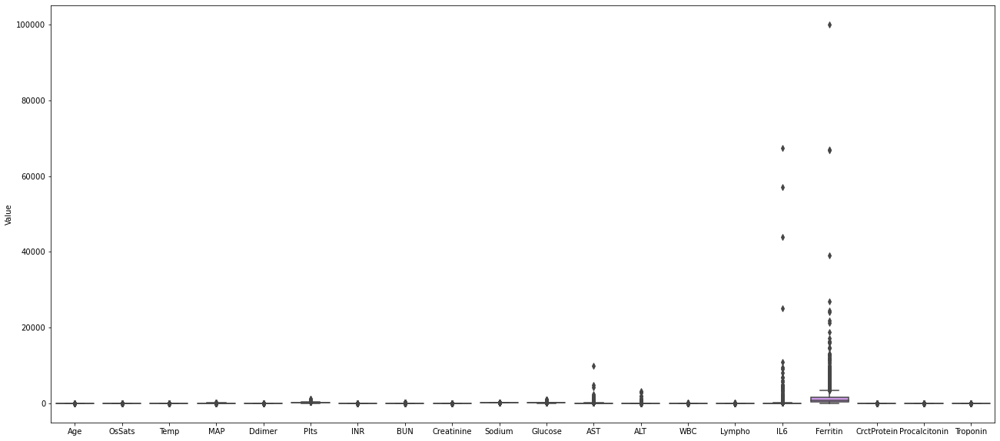

In [12]:
fig, ax = plt.subplots(figsize=(22,10))
ax = sns.boxplot(x="variable",y="value",data=X_train[x_cont_cols].melt())
ax.set_xlabel("")
ax.set_ylabel("Value")
plt.show()

In [13]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()


In [14]:
#Here we duplicate X_train, so we can transform select columns and set that into a distinct variable, X_train_scaled
X_train_scaled = X_train
X_train_scaled[x_cont_cols] = ss.fit_transform(X_train[x_cont_cols])

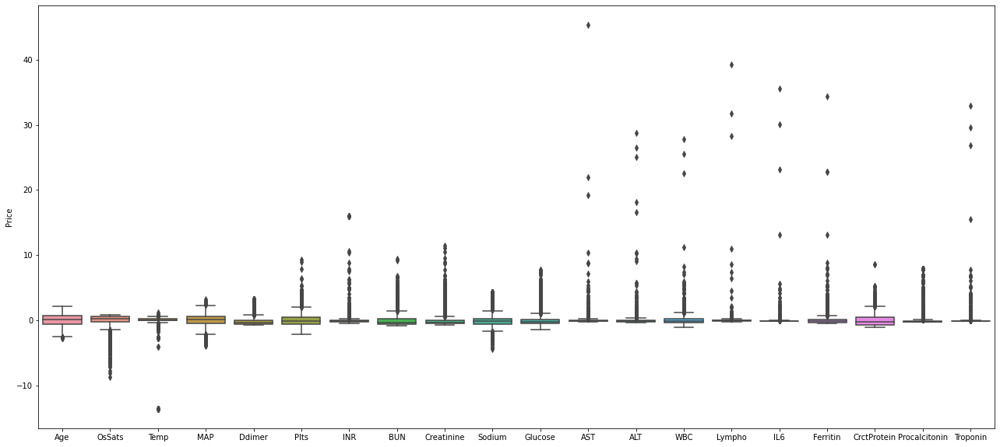

In [15]:
fig, ax = plt.subplots(figsize=(22,10))
ax = sns.boxplot(x="variable",y="value",data=X_train_scaled[x_cont_cols].melt())
ax.set_xlabel("")
ax.set_ylabel("Price")
plt.show()

# Model Creation


You may have noticed at this point that there are two columns within a, severity and death. As we have two different things to train the data on, we can actually train 2 seperate models, one classification model to predict the outcome (life/death) of a patient's treatment, and the other one to predict the severity of a patients condition.

### Part 1 - Classification Model
Here we will be using a Decision Tree classifier. As the data may have non-linear patterns and cuttofs are common tools in medicine, I thought using a similar process would help with the classification.

This model doesnt require that the data is scaled, and will most likely provide more accurate cutoffs without the scaled data.


##### Part 1a - DecisionTreeClassifier

In [16]:
from sklearn import tree
dtc = tree.DecisionTreeClassifier()

In [17]:
dtc.fit(X_train, y_train.drop([list(y_train)[1]],axis=1))

DecisionTreeClassifier()

The decision tree used for classification is shown below.

In [18]:
plt.figure(figsize=(100,100),dpi=300)
tree.plot_tree(dtc,filled=True,feature_names=list(X_train))

[Text(0.3020522531426876, 0.984375, 'MAP <= -1.109\ngini = 0.365\nsamples = 3768\nvalue = [2864, 904]'),
 Text(0.0643588493417845, 0.953125, 'Age <= -0.588\ngini = 0.355\nsamples = 416\nvalue = [96, 320]'),
 Text(0.015602145294978059, 0.921875, 'Procalcitonin <= -0.213\ngini = 0.484\nsamples = 56\nvalue = [33, 23]'),
 Text(0.005426833146079325, 0.890625, 'Ddimer <= 0.613\ngini = 0.211\nsamples = 25\nvalue = [22, 3]'),
 Text(0.0027134165730396623, 0.859375, 'gini = 0.0\nsamples = 19\nvalue = [19, 0]'),
 Text(0.008140249719118987, 0.859375, 'ALT <= -0.114\ngini = 0.5\nsamples = 6\nvalue = [3, 3]'),
 Text(0.005426833146079325, 0.828125, 'gini = 0.0\nsamples = 2\nvalue = [0, 2]'),
 Text(0.01085366629215865, 0.828125, 'IL6 <= -0.057\ngini = 0.375\nsamples = 4\nvalue = [3, 1]'),
 Text(0.008140249719118987, 0.796875, 'gini = 0.0\nsamples = 3\nvalue = [3, 0]'),
 Text(0.013567082865198313, 0.796875, 'gini = 0.0\nsamples = 1\nvalue = [0, 1]'),
 Text(0.025777457443876793, 0.890625, 'CrctProtein <

##### Part 1b - Logistic Regression Classifier

This is just an alternative classifier in case we get bad results from the decision tree.

In [19]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(max_iter=10000)

In [20]:
from sklearn.model_selection import GridSearchCV
c_space = np.logspace(-5,8,15)
param_grid = {'C': c_space, 'penalty':['l1','l2']}
lr_cv = GridSearchCV(lr, param_grid, cv=10)
lr_cv.fit(X_train, y_train.drop([list(y_train)[1]],axis=1))

c:\Users\eamor\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\eamor\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\eamor\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\eamor\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

GridSearchCV(cv=10, estimator=LogisticRegression(max_iter=10000),
             param_grid={'C': array([1.00000000e-05, 8.48342898e-05, 7.19685673e-04, 6.10540230e-03,
       5.17947468e-02, 4.39397056e-01, 3.72759372e+00, 3.16227766e+01,
       2.68269580e+02, 2.27584593e+03, 1.93069773e+04, 1.63789371e+05,
       1.38949549e+06, 1.17876863e+07, 1.00000000e+08]),
                         'penalty': ['l1', 'l2']})

In [21]:
lr_cv.best_score_

0.8327988317625147

In [22]:
lr_model = lr_cv.best_estimator_

### Part 2 - Multiclass Classification Model
We are going to use a multi-class classification model to predict the severity score of a patient based upon their vital signs.

As the model is likely to display non-linear trends, we will use a neural network to predict severity score.
* For example, sodium levels are bad if they are too high or too low, so a linear model might predict higher values as bad and lower values as good, when both are bad and perhaps another format would be better.

In [23]:
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(solver='adam',max_iter=10000,hidden_layer_sizes=(10000,))

In [24]:
y_train_severity = y_train.drop([list(y_train)[0]],axis=1)
mlp.fit(X_train_scaled, y_train_severity)

c:\Users\eamor\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:1109: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


MLPClassifier(hidden_layer_sizes=(10000,), max_iter=10000)

# Scoring

### Part 1 - Predictions Using the Models

In [25]:
y_test_death = y_test.drop([list(y_test)[1]],axis=1)
y_test_severity = y_test.drop([list(y_test)[0]],axis=1)

In [26]:
X_test_scaled = X_test
X_test_scaled[x_cont_cols] = ss.transform(X_test_scaled[x_cont_cols])

In [27]:
y_train_death_p = dtc.predict(X_train)
y_test_death_p = dtc.predict(X_test)

y_train_death_lr_p = lr_model.predict(X_train_scaled)
y_test_death_lr_p = lr_model.predict(X_test_scaled)

y_train_severity_p = mlp.predict(X_train_scaled)
y_test_severity_p = mlp.predict(X_test_scaled)

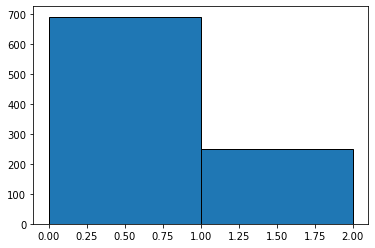

In [28]:
plt.hist(y_test_death_p, bins= np.arange(3), ec="k")
plt.show()

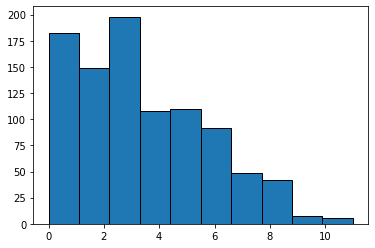

In [29]:
plt.hist(y_test_severity_p, ec="k")
plt.show()

### Part 2 - Scoring the Death Prediction Model

In [30]:
from sklearn.metrics import confusion_matrix, classification_report

<AxesSubplot:>

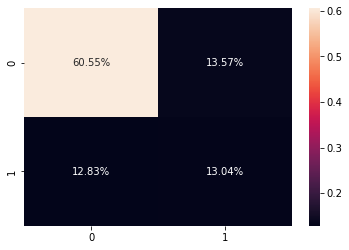

In [31]:
cf_matrix_death = confusion_matrix(y_test_death, y_test_death_p)
sns.heatmap(cf_matrix_death/np.sum(cf_matrix_death), annot=True, fmt='.2%')

In [32]:
print(classification_report(y_test_death, y_test_death_p))

              precision    recall  f1-score   support

           0       0.83      0.82      0.82       699
           1       0.49      0.50      0.50       244

    accuracy                           0.74       943
   macro avg       0.66      0.66      0.66       943
weighted avg       0.74      0.74      0.74       943



##### Part 2b - Scoring the Logistic Regression Model

<AxesSubplot:>

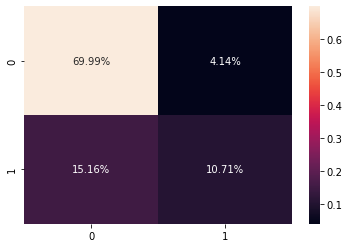

In [33]:
cf_matrix_death = confusion_matrix(y_test_death, y_test_death_lr_p)
sns.heatmap(cf_matrix_death/np.sum(cf_matrix_death), annot=True, fmt='.2%')

In [34]:
print(classification_report(y_test_death, y_test_death_lr_p))

              precision    recall  f1-score   support

           0       0.82      0.94      0.88       699
           1       0.72      0.41      0.53       244

    accuracy                           0.81       943
   macro avg       0.77      0.68      0.70       943
weighted avg       0.80      0.81      0.79       943



### Part 3 - Scoring the Severity Prediction Model

<AxesSubplot:>

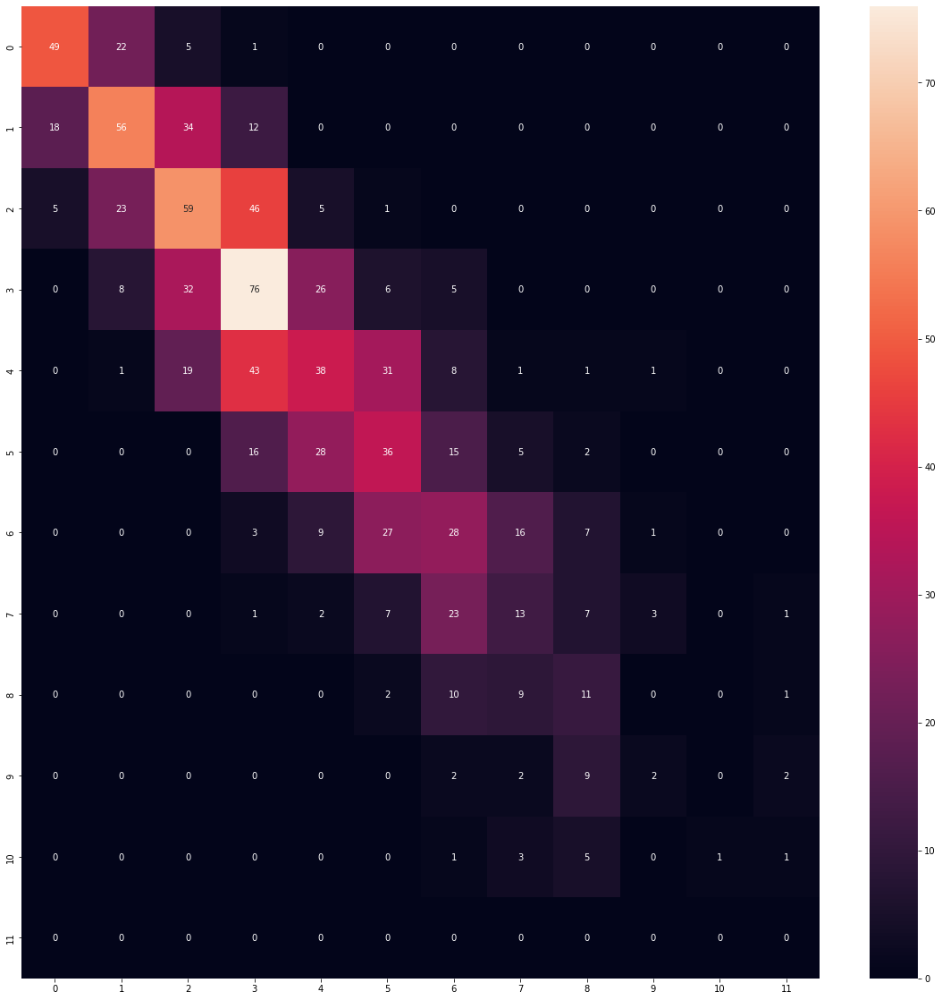

In [35]:
cf_matrix_severity = confusion_matrix(y_test_severity, y_test_severity_p)
plt.figure(figsize=(20,20))
sns.heatmap(cf_matrix_severity, annot= True)

In [36]:
print(classification_report(y_test_severity, y_test_severity_p))

              precision    recall  f1-score   support

           0       0.68      0.64      0.66        77
           1       0.51      0.47      0.49       120
           2       0.40      0.42      0.41       139
           3       0.38      0.50      0.43       153
           4       0.35      0.27      0.30       143
           5       0.33      0.35      0.34       102
           6       0.30      0.31      0.31        91
           7       0.27      0.23      0.25        57
           8       0.26      0.33      0.29        33
           9       0.29      0.12      0.17        17
          10       1.00      0.09      0.17        11
          11       0.00      0.00      0.00         0

    accuracy                           0.39       943
   macro avg       0.40      0.31      0.32       943
weighted avg       0.40      0.39      0.39       943



c:\Users\eamor\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\eamor\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\eamor\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
